# Проект 9: Рынок заведений общественного питания Москвы

## Описание проекта


---



**Инвесторы из фонда «Shut Up and Take My Money»** решили открыть заведение общественного питания в Москве.

**Заказчики не уверены в направленности заведения** (кафе, ресторан, пиццерия, паб или бар), в его расположении и ценообразовании.

**Задача** — подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес* на лето 2022 года.**

* Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

---




**Файл `moscow_places.csv`**:
* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 * «Средний счёт: 1000–1500 ₽»;
 * «Цена чашки капучино: 130–220 ₽»;
 * «Цена бокала пива: 400–600 ₽».
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 * 0 — заведение не является сетевым
 * 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например:
 * Центральный административный округ;
* `seats` — количество посадочных мест.

## Загрузка данных и изучение общей информации


In [ ]:
#importing lib-s and preferences
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import matplotlib.ticker as ticker
import scipy as sc
import datetime as dt
from datetime import datetime, timedelta
import scipy.stats as stats
pd.set_option('display.max_columns', None) #for displaying all columns
pd.set_option('display.max_colwidth', None) #for displaying full widht of columns
from plotly import graph_objects as go
import plotly.express as px
from scipy import stats as st
import math as mth
import json # подключаем модуль для работы с JSON-форматом
from folium import Map, Choropleth, Marker # импортируем карту, хороплет и маркер
from folium.plugins import MarkerCluster # импортируем кластер

In [ ]:
#function, which shows head, tail, info, description, duplicates, counts Nan's and etc. of DF

def starting_pack(data):
    print('Основная информация о датафрейме:')
    data.info()
    print()
    print('Строки начала датафрейма:')
    display(data.head())
    print('Строки конца датафрейма:')
    display(data.tail())
    print('Количество дубликатов:')
    display(data.duplicated().sum())
    print('Количество пропусков:')
    display(data.isna().sum())
    print('Описание датафрейма:')
    display(data.describe())

In [ ]:
#openning file with data from common directory
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
starting_pack(data)

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB

Строки начала датафрейма:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Строки конца датафрейма:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


Количество дубликатов:


0

Количество пропусков:


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Описание датафрейма:


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


1288 посадочных мест. Целый стадион. Посмотрим на распределение поробнее

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64


/opt/conda/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


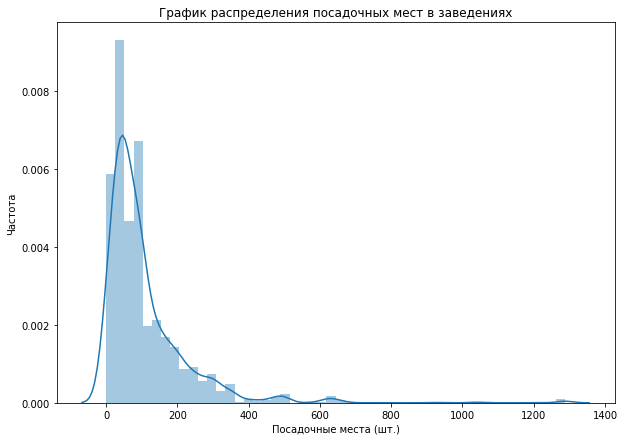

In [ ]:
print(data['seats'].describe())
plt.figure(figsize=(10, 7))
plt.title('График распределения посадочных мест в заведениях')
sns.distplot(data['seats'], bins=50);
plt.xlabel('Посадочные места (шт.)')
plt.ylabel('Частота');

По графику и таблице заметно, что 75% заведений до 140 посадочных мест. Вернемся к такому анализу в предобработке данных.

Чтобы удобнее было находить неявные дубликаты - изменим регистр названий на строчные символы

In [ ]:
data['name'] = data['name'].str.lower()

In [ ]:
print('Уникальных названий заведений:',data['name'].nunique())
print('Количество дубликатов:',data.duplicated().sum())


Уникальных названий заведений: 5512
Количество дубликатов: 0


In [ ]:
data.groupby('name').agg({'address':'count'}).sort_values(by='address',ascending=False).head(20)

,address
name,
кафе,189
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44


По первому взгляду - неявных дубликатов нет, но присутствуют названия заведений, схожие с категорией самого заведения. Посмотрим на них подробнее

In [ ]:
categories = data['category'].unique()
print('Категории заведений:',categories)

Категории заведений: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [ ]:
data.query('name in @categories')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,NaN,55.596680,37.725980,4.0,NaN,NaN,NaN,NaN,0,NaN
7938,кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,NaN,55.604990,37.724762,4.5,NaN,NaN,NaN,NaN,0,NaN
7945,кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,0,NaN
7976,кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,0,NaN


Да, такие заведения "без названия" имеют место быть.

Интересно получается, строка 108: заведение, с названием "Кафе", которое является баром/пабом не имеет посадояных мест и указанного времени работы.

Полагаю, что из датафрейма **можно убрать строки, в которых будут пропуски одновременно во времени работы, количестве посадочных мест, категории цен, среднего чека.** Такие пропуски, могли возникнуть из добавления данных с сервиса Яндекс Бизнесс, и, скорее содержат ошибки.

Посмотрим на такие строки подробнее:

In [ ]:
empty = data.query('hours.isna() and price.isna() and avg_bill.isna() and seats.isna()')
empty

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
56,рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
126,кулинария,кафе,"Москва, Череповецкая улица, 17",Северо-Восточный административный округ,NaN,55.898741,37.585301,3.9,NaN,NaN,NaN,NaN,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8206,чайхана аксы,кафе,"Москва, Волгоградский проспект, 32, корп. 12",Юго-Восточный административный округ,NaN,55.721600,37.693002,4.1,NaN,NaN,NaN,NaN,0,NaN
8228,волчок,кафе,"Москва, проспект Андропова, 18, корп. 9",Южный административный округ,NaN,55.691734,37.660548,4.6,NaN,NaN,NaN,NaN,0,NaN
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,улица гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN


235 строк без времени работы, посадочных мест, среднего чека

In [ ]:
print('Количество уникальных значений во времени работы:',data['hours'].nunique())

Количество уникальных значений во времени работы: 1307


In [ ]:
data.query('hours == "ежедневно, круглосуточно"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
10,great room bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
24,drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN
49,2u-ту-ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,намангале,кафе,"Москва, Ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN
8399,"пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


730 заведений с круглосуточным режимом работы.

In [ ]:
print('Заведений без времени работы:',data['hours'].isna().sum())

Заведений без времени работы: 536


**Вывод**

1.   Дубликаты отсутствуют, неявные дубликаты исследованы;
2.   Присутствуют пропуски - 235 строк без нужных данных, но дальнейшее удаление их неочевидно;
3.   Рейтинг заведений по пятибальной шкале;
4.   Количество заведений в датафрейме - 8405;
5.   Количество уникальных названий заведений 5512;
6.   Заведений "без уникального названия" - 270;
7.   Заведений без указанного времени работы 536;
8.   Максимальное количество посадочных мест 1288 - может быть выбросом. 75% заведений до 140 посадочных мест.


## Предобработка данных

Вернемся к заведениям без времени работы, посадочных мест, среднего чека

In [ ]:
empty = empty.index.tolist()

In [ ]:
print('Строк без времени работы, посадочных мест, среднего чека:',len(empty))
print('Потери данных при фильтрации, %:', (1-len(data.query("index not in @empty"))/len(data)))

Строк без времени работы, посадочных мест, среднего чека: 235
Потери данных при фильтрации, %: 0.02795622174637169


Удалим такие строки из датафрейма

In [ ]:
data = data.query("index not in @empty")

Создадим стобец с названием улиц


In [ ]:
splitted = []
for adress in data['address']:
  adress = adress.split(', ') #splitting ", " -> city/street/building/extra
  splitted.append(adress[1]) #adding (street) to list

data['street'] = splitted

Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [ ]:
data['is_24_7'] = np.where(data['hours'] == "ежедневно, круглосуточно", True, False)

Рассмотрим ситуацию с посадочными местами подробнее. 0 посадочных мест - вполне возможное событие, при условии того, что заведение может работать на доставку (Яндекс.Еда), работать в режиме "только с собой" и прочее.
Рассмотрим заведения с присутствующими посадочными местами, с разбивкой по сетевому признаку, чтобы найти выбросы

Посмотрим на это распределение на графике "ящик с усами"

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64


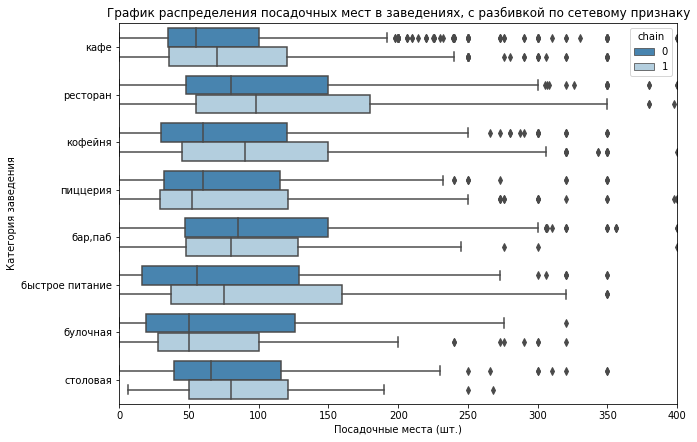

In [ ]:
print(data['seats'].describe())

sns.color_palette("Blues", as_cmap=True)
#OXY, Title names

plt.figure(figsize=(10, 7))
plt.title('График распределения посадочных мест в заведениях, c разбивкой по сетевому признаку')
sns.boxplot(x='seats',y='category',hue='chain', data=data, palette='Blues_r')
plt.xlim(0,400)
plt.xlabel('Посадочные места (шт.)')
plt.ylabel('Категория заведения');

Интересное распределение: после 250 посадочных мест - очевидные выбросы, так как значения расположились в одну колонку.
Ограничим датафрейм до максимума в 250 посадочных мест и посмотрим еще раз.

/opt/conda/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


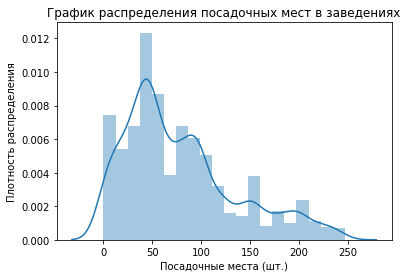

In [ ]:

#OXY, Title names
plt.ylabel('Плотность распределения')
plt.title('График распределения посадочных мест в заведениях')

sns.distplot(data.query('seats < 250')['seats'], bins=20);

plt.xlabel('Посадочные места (шт.)');

count    4324.000000
mean       78.242137
std        57.435010
min         0.000000
25%        40.000000
50%        60.000000
75%       100.000000
max       247.000000
Name: seats, dtype: float64


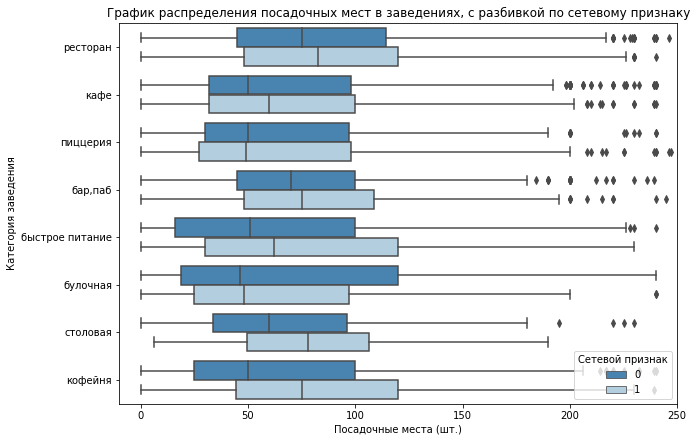

In [ ]:
print(data.query('seats < 250')['seats'].describe())

sns.color_palette("Blues", as_cmap=True)
#OXY, Title names

plt.figure(figsize=(10, 7))
plt.title('График распределения посадочных мест в заведениях, c разбивкой по сетевому признаку')
sns.boxplot(x='seats',y='category',hue='chain', data=data.query('seats < 250'), palette='Blues_r')
plt.xlim(-10,250)
plt.xlabel('Посадочные места (шт.)')
plt.ylabel('Категория заведения')
plt.legend(loc='lower right', title='Сетевой признак');

In [ ]:
print('Заведений с посадочными местами более 250:',data.query('seats > 250')['name'].count())
print('Потери данных при фильтрации, %:', round(data.query('seats > 250')['name'].count()/data['name'].count()*100,2))

Заведений с посадочными местами более 250: 400
Потери данных при фильтрации, %: 4.9


От 5% данные не подвергнутся значительному искажению. Отфильтруем.

In [ ]:
data_to_much = data.query('seats > 250')
data_to_much

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
127,арарат,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914310,37.538953,4.2,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
171,one price coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909838,37.541526,4.0,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
176,вуди пицца,пиццерия,"Москва, Дмитровское шоссе, 107А, корп. 1",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.878504,37.540110,4.0,средние,Средний счёт:400–600 ₽,500.0,NaN,0,350.0,Дмитровское шоссе,False
194,ленкорань,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914574,37.539103,1.4,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
216,грузинский бульвар,быстрое питание,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909115,37.540112,4.0,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8198,милти,быстрое питание,"Москва, улица Ленинская Слобода, 19",Южный административный округ,пн-пт 09:00–19:00,55.708303,37.652822,3.8,NaN,NaN,NaN,NaN,0,450.0,улица Ленинская Слобода,False
8220,шеф гирос,быстрое питание,"Москва, проспект Андропова, 22",Южный административный округ,"ежедневно, 09:00–22:00",55.682823,37.661115,4.2,NaN,Средний счёт:250–350 ₽,300.0,NaN,0,300.0,проспект Андропова,False
8237,pasta cup & pinsa,пиццерия,"Москва, Автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.704647,37.639556,3.5,средние,Средний счёт:450–700 ₽,575.0,NaN,0,455.0,Автозаводская улица,False
8315,чайхана бишкек,ресторан,"Москва, Тихорецкий бульвар, 2, корп. 1",Юго-Восточный административный округ,"ежедневно, 09:00–01:30",55.679190,37.776553,4.1,NaN,NaN,NaN,NaN,0,305.0,Тихорецкий бульвар,False


In [ ]:
data_to_much = data_to_much.index.tolist()
data_new = data.query("index not in @data_to_much")
data_new.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,7771.000000,7771.000000,7771.000000,2961.000000,511.000000,7771.000000,4395.000000
mean,55.750525,37.609393,4.237872,949.013847,175.046967,0.382576,81.016837
std,0.069513,0.098101,0.460983,1021.628405,89.959957,0.486047,60.946384
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705447,37.539789,4.100000,375.000000,125.000000,0.000000,40.000000
50%,55.754670,37.606618,4.300000,700.000000,169.000000,0.000000,64.000000
75%,55.795096,37.665408,4.400000,1250.000000,225.000000,1.000000,107.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,250.000000


In [ ]:
data_new['address'] = data_new['address'].str.lower()
name_and_address_dub = data_new[data_new.duplicated(subset=['name','address'])]
name_and_address_dub

/tmp/ipykernel_518/1166826259.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['address'] = data_new['address'].str.lower()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды,False
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,проспект Мира,False


Да, нашлись дубликаты в паре название-адрес. Их, к счастью, всего 3 строки. Удалим.

In [ ]:
data_new = data_new.drop_duplicates(subset=['name','address'], keep='first')
data_new = data_new.reset_index(drop=True)
data_new

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7763,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
7764,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
7765,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
7766,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


**Вывод**


1.   Создана колонка с названием улиц;
2.   Создана категориальная колонка, отражающая режим работы 24/7;
3.   Определена верхняя граница исследуемых данных в 250 посадочных мест;
4.   Удалены строки без заполненных колонок с временем работы, средним чеком и количесвтом посадочных мест;
5.   Удалены неявные дубликаты в паре название заведения-адрес.


## **Анализ данных**



### Категории заведений в данных
Посмотрим как заведения распределены по категориям

In [ ]:
by_category = (data_new
               .groupby('category')
               .agg({'name':'count'})
               .rename(columns = {'name':'count'})
               .sort_values(by='count',ascending=False)
               .reset_index()
)
by_category['percentage'] = round(by_category['count']/by_category['count'].sum()*100,2)
by_category

,category,count,percentage
0,кафе,2116,27.24
1,ресторан,1898,24.43
2,кофейня,1334,17.17
3,"бар,паб",709,9.13
4,пиццерия,605,7.79
5,быстрое питание,565,7.27
6,столовая,301,3.87
7,булочная,240,3.09


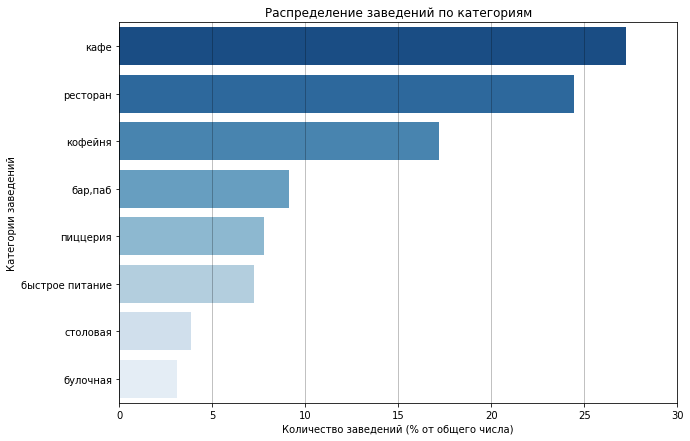

In [ ]:
plt.figure(figsize=(10, 7))
sns.barplot(x='percentage', y='category', data=by_category, orient='h',palette='Blues_r', alpha=1)
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений (% от общего числа)')
plt.ylabel('Категории заведений')
plt.xlim(0,30)
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Вывод**

1.   Всего 7 типов заведений;
2.   Первые строчки по количеству - кафе, ресторан, кофейня.


### Посадочные места

Исследуем количество посадочных мест в местах по категориям


,category,count,seats
0,ресторан,1898,104954.0
1,кафе,2116,84660.0
2,кофейня,1334,55102.0
3,"бар,паб",709,36167.0
4,пиццерия,605,29552.0
5,быстрое питание,565,24156.0
6,столовая,301,11642.0
7,булочная,240,9498.0


,category,count,seats
0,ресторан,1898,80.0
1,"бар,паб",709,74.5
2,кофейня,1334,65.0
3,столовая,301,64.0
4,быстрое питание,565,56.0
5,кафе,2116,52.5
6,пиццерия,605,50.0
7,булочная,240,48.0


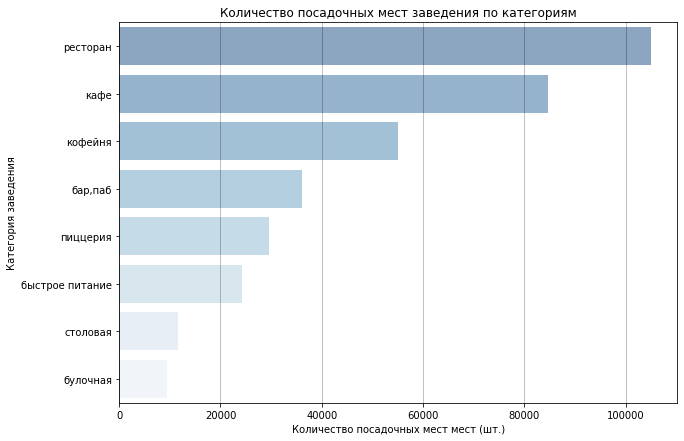

In [ ]:
by_seats_sum = (data_new
            .groupby('category')
            .agg({'name':'count', 'seats':'sum'})
            .rename(columns = {'name':'count'})
            .sort_values(by='seats',ascending=False)
            .reset_index())
display(by_seats_sum)

by_seats_median = (data_new
            .groupby('category')
            .agg({'name':'count', 'seats':'median'})
            .rename(columns = {'name':'count'})
            .sort_values(by='seats',ascending=False)
            .reset_index())
display(by_seats_median)

plt.figure(figsize=(10, 7))

ax1 = sns.barplot(x='seats', y='category', data=by_seats_sum, orient='h',palette='Blues_r', alpha=0.5)
ax1.set_title('Количество посадочных мест заведения по категориям')
ax1.set_xlabel('Количество посадочных мест мест (шт.)')
ax1.set_ylabel('Категория заведения')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()


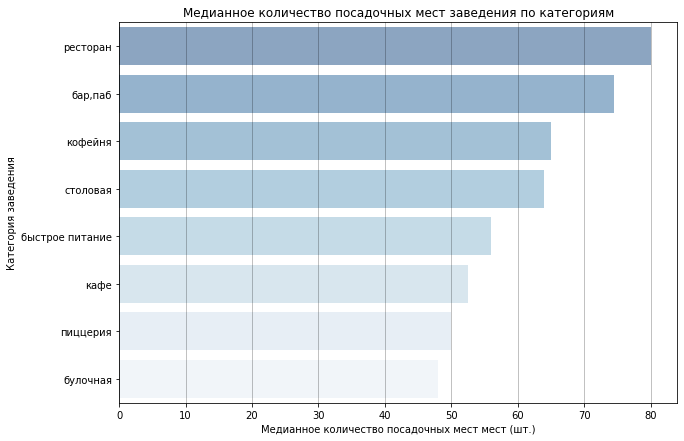

In [ ]:
plt.figure(figsize=(10, 7))
ax2 = sns.barplot(x='seats', y='category', data=by_seats_median, orient='h',palette='Blues_r', alpha=0.5)
ax2.set_title('Медианное количество посадочных мест заведения по категориям')
ax2.set_xlabel('Медианное количество посадочных мест мест (шт.)')
ax2.set_ylabel('Категория заведения')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x');

**Вывод**

1.   Больше заведений - больше посадочных мест;
2.   Интересно, что медианное количество посадочных мест от 48 до 80.


### Сетевые и одиночные заведения
Рассмотрим соотношение сетевых и несетевых заведений в датасете


,category,chain,total,percentage
0,кафе,717,2116,33.88
1,ресторан,664,1898,34.98
2,кофейня,673,1334,50.45
3,"бар,паб",160,709,22.57
4,пиццерия,312,605,51.57
5,быстрое питание,214,565,37.88
6,столовая,84,301,27.91
7,булочная,147,240,61.25


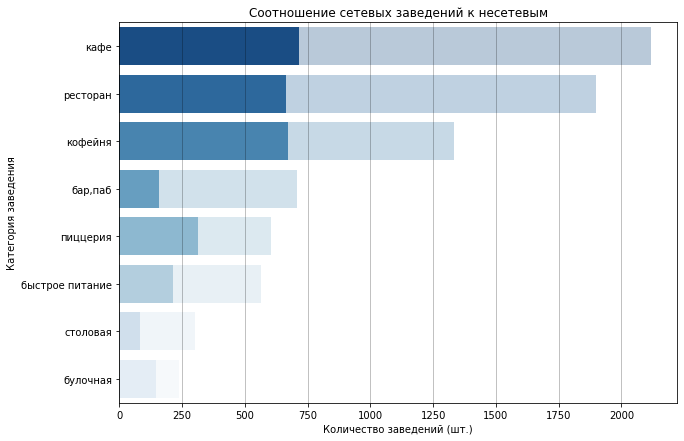

In [ ]:
chain = (data_new
         .groupby('category')
         .agg({'chain' : 'sum', 'name' : 'count'})
         .rename(columns = {'name':'total'})
)
chain['percentage'] = round(chain['chain']/chain['total']*100,2)
chain = chain.sort_values(by='total',ascending=False).reset_index()
display(chain)

plt.figure(figsize=(10, 7))

ax = sns.barplot(x='chain', y='category', data=chain, orient='h',palette='Blues_r', alpha=1)
ax1 = sns.barplot(x='total', y='category', data=chain, orient='h',palette='Blues_r', alpha=0.3)
plt.title('Соотношение сетевых заведений к несетевым')
plt.xlabel('Количество заведений (шт.)')
plt.ylabel('Категория заведения')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Вывод**

1.   Рестораны и кафе - более 33% сетевые;
2.   Кофейни, пиццерии и булочные - более половины - сетевые.


### Популярные заведения
Исследуем самые популярные сети заведений

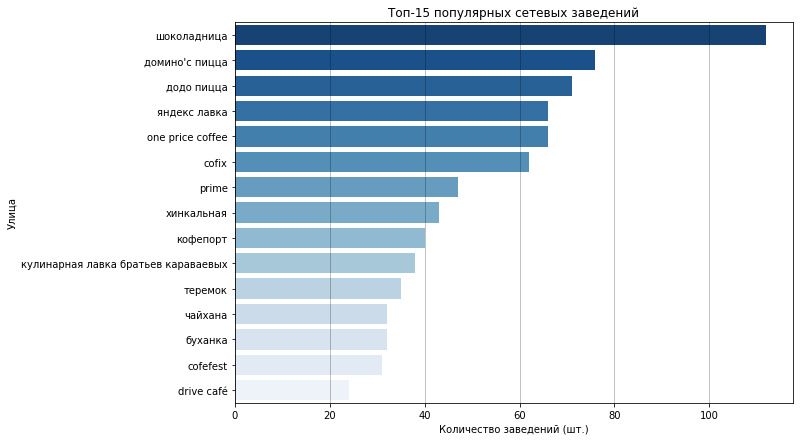

In [ ]:
popular_chain = (data_new.query('chain == 1')
                .groupby('name')
                .agg({'chain':'count'})
                .rename(columns = {'chain':'total'})
                .sort_values(by='total',ascending=False)
                .reset_index())
popular_chain.head(15)

plt.figure(figsize=(10, 7))
sns.barplot(x='total', y='name', data=popular_chain.head(15), orient='h',palette='Blues_r', alpha=1)
plt.title('Топ-15 популярных сетевых заведений')
plt.xlabel('Количество заведений (шт.)')
plt.ylabel('Улица')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Вывод**

1.   Лидерами сетевых заведений являются: Шоколадница, Доминос, Додо пицца, One price coffre и Cofix;
2.   Из предыдущего вывода следует что: больше всего популярных заведений в категориях кофейни, быстрое питание и кафе;
3.   Также, можно учесть тот фактор, что такие заведения являются местом встречи, так как их количество (по личному опыту) сконцентрировано вокруг потоков горожан.


### Расположение заведений
Исследуем расположение заведений. Посмотрим на районы города.

In [ ]:
print('Административные районы, в которых расположены заведения датасета:',data_new['district'].unique())

Административные районы, в которых расположены заведения датасета: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


Заведения расположены в районах города Москвы (в пределах МКАД).

In [ ]:
by_district = (data_new
              .groupby('district')
              .agg({'name':'count'})
              .rename(columns = {'name':'total'})
              .sort_values(by='total',ascending=False)
              .reset_index())
# by_district['district'] = by_district['district'].str.split().str[0]
by_district['percentage'] = round(by_district['total']/by_district['total'].sum()*100,2)
by_district

,district,total,percentage
0,Центральный административный округ,2097,27.00
1,Северный административный округ,833,10.72
2,Северо-Восточный административный округ,821,10.57
3,Южный административный округ,804,10.35
4,Восточный административный округ,749,9.64
5,Западный административный округ,749,9.64
6,Юго-Западный административный округ,675,8.69
7,Юго-Восточный административный округ,657,8.46
8,Северо-Западный административный округ,383,4.93


Больше всего заведений в центральной части города, что является очевидным фактом

In [ ]:
district_category = data_new.pivot_table(index = 'district',
                                         columns = 'category',
                                         values = 'name',
                                         aggfunc = 'count').reset_index()
# district_category['district'] = district_category['district'].str.split().str[0]
district_category

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,44,24,68,242,101,71,159,40
1,Западный административный округ,44,32,57,202,136,66,190,22
2,Северный административный округ,63,35,54,215,183,69,175,39
3,Северо-Восточный административный округ,53,26,78,242,152,65,166,39
4,Северо-Западный административный округ,22,12,28,95,62,40,108,16
5,Центральный административный округ,344,49,80,431,404,105,620,64
6,Юго-Восточный административный округ,38,12,66,238,87,55,137,24
7,Юго-Западный административный округ,38,26,59,217,93,64,161,17
8,Южный административный округ,63,24,75,234,116,70,182,40


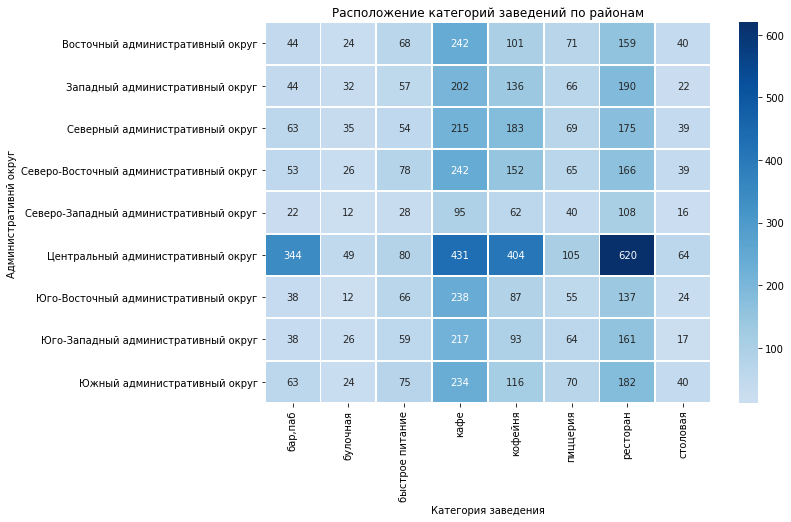

In [ ]:
temp1 = district_category[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']]
temp1
districts = district_category['district']
plt.figure(figsize=(10, 7))
p1 = sns.heatmap(temp1, cmap = "Blues", center = 230, yticklabels=districts, annot=True, linewidths=1, fmt=',.0f')
plt.title('Расположение категорий заведений по районам')
plt.xlabel('Категория заведения')
plt.ylabel('Административнй округ');

**Вывод**

1.   Заведения сосредотачиваются, преимущественно в центральной части города;
2.   Больше всего ресторанов, кафе, кофеен или баров/пабов;
3.   Булочных, пиццерий, столовых и заведений быстрого питания оказывается меньше всего;
4.   Если рассмотреть распределение категорий по райнам города - значительная часть сосредоточена в центральном районе, и примерно одинаково рассредоточены заведения в остальных районах, кроме ЮВ и СЗ административных округов.



### Рейтинги заведений
Исследуем распределение средних рейтингов по категориям заведений

In [ ]:
category_mean_rating = (data_new
                        .groupby('category')
                        .agg({'rating':'mean'})
                        .sort_values(by='rating',ascending=False)
                        .reset_index())
category_mean_rating['rating'] = round(category_mean_rating['rating'],2)
category_mean_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.30
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.22
6,кафе,4.14
7,быстрое питание,4.05


In [ ]:
district_category_rating = data_new.pivot_table(index = 'district',
                                         columns = 'category',
                                         values = 'rating',
                                         aggfunc = 'mean').reset_index()
district_category_rating

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,4.340909,4.175000,4.027941,4.133058,4.284158,4.269014,4.191195,4.232500
1,Западный административный округ,4.377273,4.246875,3.947368,4.082178,4.192647,4.278788,4.268421,4.122727
2,Северный административный округ,4.341270,4.277143,4.003704,4.200000,4.298907,4.301449,4.280571,4.228205
3,Северо-Восточный административный округ,4.175472,4.342308,4.021795,4.088843,4.223684,4.266154,4.228313,4.069231
4,Северо-Западный административный округ,4.395455,4.283333,3.960714,4.117895,4.325806,4.337500,4.293519,4.206250
5,Центральный административный округ,4.486047,4.371429,4.271250,4.300696,4.334901,4.420000,4.420806,4.317188
6,Юго-Восточный административный округ,4.200000,4.025000,3.922727,4.071849,4.218391,4.185455,4.168613,4.116667
7,Юго-Западный административный округ,4.350000,4.184615,4.094915,4.036406,4.278495,4.340625,4.250932,4.241176
8,Южный административный округ,4.271429,4.320833,4.082667,4.082906,4.223276,4.261429,4.208242,4.270000


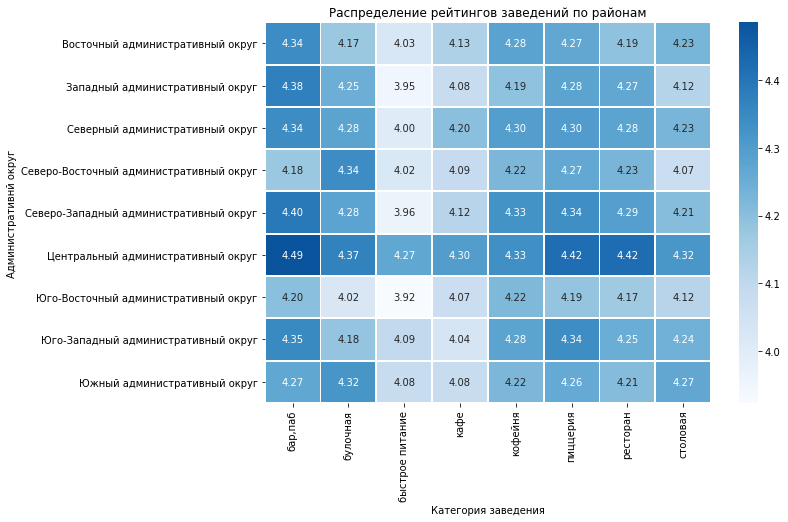

In [ ]:
plt.figure(figsize=(10, 7))
temp2 = district_category_rating[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']]
p1 = sns.heatmap(temp2, cmap = "Blues", center = 4.25, yticklabels=districts, annot=True, linewidths=1, fmt=',.2f')
plt.title('Распределение рейтингов заведений по районам')
plt.xlabel('Категория заведения')
plt.ylabel('Административнй округ');

### Хороплет среднего рейтинга
Посмотрим на распределение рейтингов заведений по районам на карте

In [ ]:
rating_df = data_new.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.187984
1,Западный административный округ,4.182109
2,Северный административный округ,4.249580
3,Северо-Восточный административный округ,4.162363
4,Северо-Западный административный округ,4.237337
5,Центральный административный округ,4.380210
6,Юго-Восточный административный округ,4.114155
7,Юго-Западный административный округ,4.183407
8,Южный административный округ,4.178234


In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_new.apply(create_clusters, axis=1)

# выводим карту
m

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)


# выводим карту
m

**Вывод**

1.   Рейтинги, практически всех, категорий заведений преимущественно выше 4;
2.   Единственной "выбивающейся" категорией являются заведения быстрого питания, из-за их количества;
3.   Центральная часть города опережает остальные по рейтингам заведений, что неудивительно.



### Улицы с большим количеством заведений
Найдём топ-15 улиц по количеству заведений


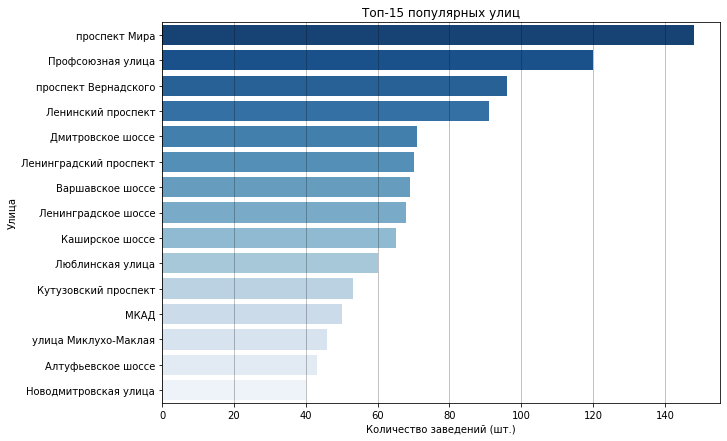

In [ ]:
popular_streets = (data_new
                .groupby('street')
                .agg({'name':'count'})
                .rename(columns = {'name':'total'})
                .sort_values(by='total',ascending=False)
                .reset_index())
popular_streets.head(15)

plt.figure(figsize=(10, 7))
sns.barplot(x='total', y='street', data=popular_streets.head(15), orient='h',palette='Blues_r', alpha=1)
plt.title('Топ-15 популярных улиц')
plt.xlabel('Количество заведений (шт.)')
plt.ylabel('Улица')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

In [ ]:
popular_streets.head(15)
popular_15 = popular_streets['street'].head(15)
popular_15 = popular_15.tolist()

In [ ]:
data_15_streets = data_new.query('street in @popular_15')
data_15_streets_by_category = data_15_streets.pivot_table(index = 'street',
                                         columns = 'category',
                                         values = 'name',
                                         aggfunc = 'count')
data_15_streets_by_category['sum'] = data_15_streets_by_category.sum(axis='columns')
data_15_streets_by_category = data_15_streets_by_category.sort_values(by='sum', ascending=True).reset_index()
data_15_streets_by_category

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
0,Новодмитровская улица,3.0,NaN,5.0,12.0,12.0,2.0,5.0,1.0,40.0
1,Алтуфьевское шоссе,4.0,1.0,5.0,11.0,9.0,3.0,9.0,1.0,43.0
2,улица Миклухо-Маклая,3.0,NaN,4.0,19.0,4.0,2.0,14.0,NaN,46.0
3,МКАД,NaN,NaN,8.0,33.0,3.0,NaN,5.0,1.0,50.0
4,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,2.0,53.0
5,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60.0
6,Каширское шоссе,2.0,NaN,8.0,17.0,13.0,4.0,17.0,4.0,65.0
7,Ленинградское шоссе,5.0,2.0,5.0,12.0,13.0,3.0,25.0,3.0,68.0
8,Варшавское шоссе,6.0,NaN,7.0,17.0,11.0,4.0,17.0,7.0,69.0
9,Ленинградский проспект,13.0,2.0,2.0,7.0,18.0,6.0,20.0,2.0,70.0


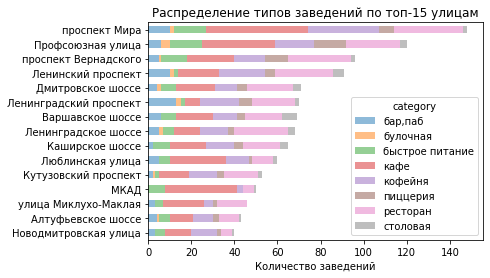

In [ ]:
data_15_streets_by_category.loc[:, 'street':'столовая'].plot(x='street', kind='barh', stacked=True,
        title='Распределение типов заведений по топ-15 улицам', alpha=0.5)
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.show()


Посмотрим на улицы с одним заведением подробнее

In [ ]:
only_one = popular_streets.query('total == 1')
only_one_list = only_one['street'].tolist()


In [ ]:
only1 = data_new.query("street in @only_one_list")
only1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
55,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7660,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
7682,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
7739,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
7742,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [ ]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m4)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
only1.apply(create_clusters, axis=1)

# выводим карту
m4

**Вывод**

1.   Длинные улицы = больше заведений;
2.   В основном, заведения сконцентрированы на проходимых улицах, ведь для получения прибыли необходимое условие - посещаемость.


### Средний чек в заведениях




In [ ]:
med_bill_district = (data_new
                     .groupby('district')
                     .agg({'middle_avg_bill':'median'})
                     .rename(columns = {'middle_avg_bill':'median'})
                     .sort_values(by='median',ascending=False)).reset_index()
med_bill_district

,district,median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,687.5
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,444.5


In [ ]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=med_bill_district,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Медианный средний чек',
).add_to(m1)

# выводим карту
m1

**Вывод**

1.   В средний чек закладывается стоимость аренды и прочие расходы, соответственно чем "дороже" район - тем больше средний чек;
2.   Наиболее дорогие районы - ЦАО и ЗАО;
3.   Менее дорогие районы - спальные или промышленные: ЮВАО, ЮВО, САО.

## Детализируем исследование: открытие кофейни

Посмотрим сколько кофеен в датасете

In [ ]:
coffee = data_new.query('category == "кофейня"')
print('Кофеен в датасете:', len(coffee))

Кофеен в датасете: 1334


Особенности их расположения

In [ ]:
coffee_by_district = (coffee
                      .groupby('district')
                      .agg({'name':'count'})
                      .sort_values(by='name', ascending=False)).reset_index()

coffee_by_district['district'] = coffee_by_district['district'].str.split().str[0]
coffee_by_district['percentage'] = round(coffee_by_district['name']/coffee_by_district['name'].sum()*100,2)
coffee_by_district

,district,name,percentage
0,Центральный,404,30.28
1,Северный,183,13.72
2,Северо-Восточный,152,11.39
3,Западный,136,10.19
4,Южный,116,8.70
5,Восточный,101,7.57
6,Юго-Западный,93,6.97
7,Юго-Восточный,87,6.52
8,Северо-Западный,62,4.65


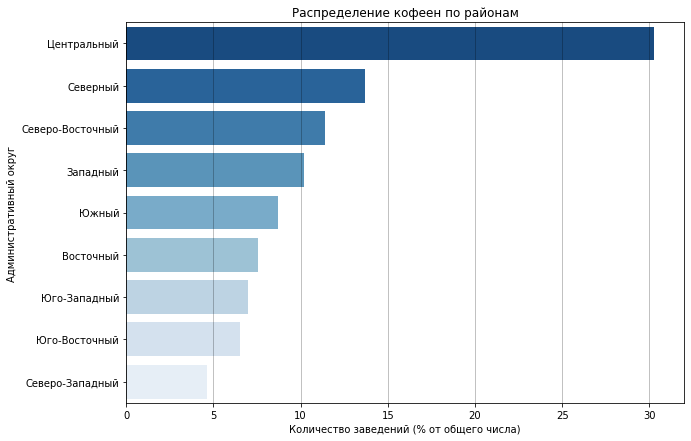

In [ ]:
plt.figure(figsize=(10, 7))
sns.barplot(x='percentage', y='district', data=coffee_by_district, orient='h',palette='Blues_r', alpha=1)
plt.title('Распределение кофеен по районам')
plt.xlabel('Количество заведений (% от общего числа)')
plt.ylabel('Административный округ')
plt.xlim(0,32)
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Вывод**

Кофейни, преимущественно расположены в ЦАО, САО, СВАО и ЗАО - дорогих или средних, по ценообразованию.

Рейтинги у кофеен, средний счет, количество посадочных мест по районам

In [ ]:
coffee_avg_all = (coffee
                      .groupby('district')
                      .agg({'name':'count','middle_coffee_cup':['mean','median'],'rating':'mean', 'seats':'median'})
                      .sort_values(by=('name','count'),ascending=False)).reset_index()
coffee_avg_all

district  name middle_coffee_cup         \
                                           count              mean median   
0       Центральный административный округ   404        187.146497  190.0   
1          Северный административный округ   183        168.101449  160.0   
2  Северо-Восточный административный округ   152        167.758621  166.0   
3          Западный административный округ   136        187.688889  185.0   
4             Южный административный округ   116        155.923077  144.0   
5         Восточный административный округ   101        174.609756  135.0   
6      Юго-Западный административный округ    93        184.176471  198.0   
7     Юго-Восточный административный округ    87        152.787879  150.0   
8   Северо-Западный административный округ    62        165.523810  165.0   

     rating  seats  
       mean median  
0  4.334901   80.0  
1  4.298907   58.0  
2  4.223684   72.5  
3  4.192647   80.0  
4  4.223276   50.0  
5  4.284158   52.0  
6  4.278495   64.0  
7  4.218391   50.0  
8  4.325806   87.5

Посмотрим их детальное расположение на карте

In [ ]:
coffee_avg_bill = (coffee
                      .groupby('district')
                      .agg({'middle_coffee_cup':'mean'})
                      .sort_values(by='middle_coffee_cup',ascending=False)).reset_index()

In [ ]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_avg_bill,
    columns=['district','middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Cредний чек кофеен по районам',
).add_to(m3)

# выводим карту
m3
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m3

In [ ]:
print('Средняя цена чашки кофе по Москве:', round(coffee['middle_coffee_cup'].mean()),'р')

Средняя цена чашки кофе по Москве: 175 р


**Вывод**

1. Средняя цена чашки кофе по районам - примерно одинаковая (с разницей в 30р);
2. Средняя цена чашки кофе по Москве: 175р.

Круглосуточные кофейни

In [ ]:
print('Кофеен с круглосуточным режимом работы:',len(coffee.query('is_24_7 == True')))

Кофеен с круглосуточным режимом работы: 58


In [ ]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_avg_bill,
    columns=['district','middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Cредний чек кофеен по районам',
).add_to(m5)

# выводим карту
m5
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m5)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.query('is_24_7 == True').apply(create_clusters, axis=1)

# выводим карту
m5

**Вывод**

Круглосуточные заведения есть. Они, приемущественно, расположены вдоль проспектов, шоссе, транспортных развязок. Причиной этому является круглосуточный поток автомобилей.

## Общий вывод

****

Был исследован датасет с заведениями в г. Москве.

**В результате предобработки:**

1.   Создана колонка с названием улиц;
2.   Создана категориальная колонка, отражающая режим работы 24/7;
3.   Определена верхняя граница исследуемых данных в 250 посадочных мест;
4.   Удалены строки без заполненных колонок с временем работы, средним чеком и количесвтом посадочных мест;
5.   Удалены строки с неявными дубликатами в паре название заведения-адрес.

**Анализ данных показал:**

1.   Всего 7 типов заведений. Первые строчки по количеству - кафе, ресторан, кофейня.
2.   Медианное количество посадочных мест от 48 до 80.
3.   Рестораны и кафе - более 33% сетевые. Кофейни, пиццерии и булочные - более половины - сетевые.
4.   Лидерами сетевых заведений являются: Шоколадница, Доминос, Додо пицца, One price coffre и Cofix: больше всего популярных заведений в категориях кофейни, быстрое питание и кафе. Такие заведения являются местом встречи, так как их количество сконцентрировано вокруг потоков горожан.
5.   Заведения сосредотачиваются, преимущественно в центральной части города (больше всего ресторанов, кафе, кофеен или баров/пабов). Булочных, пиццерий, столовых и заведений быстрого питания оказывается меньше всего.
6.   Если рассмотреть распределение категорий по районам города - значительная часть сосредоточена в центральном районе, и примерно одинаково рассредоточены заведения в остальных районах, кроме ЮВ и СЗ административных округов - там их меньше всего.
7.   Рейтинги, практически всех, категорий заведений преимущественно выше. Единственной "выбивающейся" категорией являются заведения быстрого питания, из-за их количества. Центральная часть города опережает остальные по рейтингам заведений, что неудивительно.
8.   Длинные улицы = больше заведений. В основном, заведения сконцентрированы на проходимых улицах, ведь для получения прибыли необходимое условие - посещаемость.
9.   В средний чек закладывается стоимость аренды и прочие расходы, соответственно чем "дороже" район - тем больше средний чек. Наиболее дорогие районы - ЦАО и ЗАО. Менее дорогие районы - спальные или промышленные: ЮВАО, ЮВО, САО.

**Кофейни**

1. Всего кофеен, подвергшихся анализу - 1334.
2. Кофейни, преимущественно расположены в ЦАО, САО, СВАО и ЗАО - дорогих или средних, по ценообразованию.
3. Средняя цена чашки кофе по районам - от 150 до 190р, в целом по городу - 175р.

**Детализируем открытие кофейни**

1. Следует обратить внимание на: локацию;
2. От локации будет зависеть цена чашки кофе;
3. Заказчик не боится конкуренции.

Исходя из трёх факторов открытия кофейни: расположение ЦАО (любая часть), САО, СВАО и ЗАО - ближе к ЦАО. Простыми словами - где большая проходимость.

Соответственно, если кофейня будет расположена ближе к центральной части города, средняя цена чашки кофе будет от 190р.

Размер заведения предпочтительно от 40 до 60 посадочных мест.



Презентация:
https://drive.google.com/file/d/1wYC55yFZic-BzoKjSiutX-Um-WU-bmhz/view?usp=share_link